# MD005 Quarto entregable: Optimización

## Procesado Inicial

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats

import statsmodels.api as sm

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

import plotly.express as px

from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve, auc
from sklearn.preprocessing import StandardScaler

import seaborn as sns

from sklearn.metrics import confusion_matrix
from sklearn.decomposition import PCA
from sklearn.feature_selection import mutual_info_classif

from sklearn.tree import DecisionTreeClassifier, export_graphviz
from six import StringIO
import pydot
import warnings
from IPython.display import Image

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import KFold, StratifiedKFold, cross_val_predict

from skopt import BayesSearchCV

import sklearn

import time

Como todo el procesamiento de los datos ya se ha hecho en las entregas anteriores y para no ser repetitivo, haré un pequeño resumen de lo hecho en cuanto al tratamiento de los datos y a lo que se ha observado de estos.

In [11]:
dtf = pd.read_csv(r'C:\Users\josep\Downloads\data_all\data_all.csv', sep = ',', encoding = 'latin1', error_bad_lines=False) #error_bad_lines is avoid single line error

dtf = dtf.dropna()

remakes = dtf[dtf['total_blue_turrets'] == 0]
remakes = remakes[remakes['total_red_turrets'] == 0]

merged_df = dtf.merge(remakes, indicator=True, how='left')
dtf2 = merged_df[merged_df['_merge'] == 'left_only']
dtf = dtf2.drop(columns=['_merge'])

outlier = dtf[dtf['total_red_kills'] == 0]
outlier = outlier[outlier['winning_team'] == 1]

outlier_condition = (dtf['winning_team'] == 1) & (dtf['total_red_kills'] == 0)
dtf = dtf[~outlier_condition]

dtf_red = dtf.filter(regex='(red|winning_team)')
dtf_blue = dtf.filter(regex='(blue|winning_team)')
dtf_red.describe()

,total_red_barons,total_red_drakes,total_red_heralds,total_red_inhibs,total_red_kills,total_red_turrets,red_first_blood,red_first_herald,red_first_drake,red_first_baron,...,total_red_vs,total_red_gold,med_red_kills,med_red_xp,med_red_gold,med_red_dmg,red_got_soul,total_red_elders,med_red_vs,winning_team
count,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,...,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000
mean,0.363105,0.504250,0.463482,0.402568,0.496255,0.493927,0.488586,0.462518,0.512444,0.362807,...,0.496957,0.499357,0.492156,0.500310,0.499193,0.497810,0.120940,0.022543,0.498273,0.495273
std,0.455714,0.353926,0.431874,0.464142,0.154863,0.318068,0.499871,0.498594,0.499846,0.480811,...,0.066928,0.053830,0.184858,0.048040,0.056496,0.085000,0.326058,0.146505,0.075722,0.499979
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.025000,0.308279,0.000000,0.264141,0.260425,0.122982,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.250000,0.000000,0.000000,0.375000,0.214286,0.000000,0.000000,0.000000,0.000000,...,0.453202,0.455484,0.360000,0.458405,0.454576,0.436846,0.000000,0.000000,0.449664,0.000000
50%,0.000000,0.500000,0.500000,0.000000,0.495327,0.500000,0.000000,0.000000,1.000000,0.000000,...,0.496970,0.498765,0.500000,0.499725,0.499009,0.497695,0.000000,0.000000,0.500000,0.000000
75%,1.000000,0.800000,1.000000,1.000000,0.617021,0.769231,1.000000,1.000000,1.000000,1.000000,...,0.540741,0.543332,0.625000,0.542484,0.543863,0.558497,0.000000,0.000000,0.547059,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.906250,0.697141,1.000000,0.827078,0.714896,0.955552,1.000000,1.000000,1.000000,1.000000


En el codigo anterior he juntado todo el tratamiento de datos realizado en las previas entregas donde veiamos como los datos no tienen ningun valor nulo y me deshacia de los outliers de mi dataset descartando aquellas partidas que muy posiblemente habian sido remakes y algun valor más que no tenia demasiado sentido.

En los analisis exploratorios de los datos en las anteriores entregas vimos como el test anova no aportaba demasiada información en cuánto a las variables. También vimos como en la PCA y analisis de factores, a partir del segundo componente la varianza explicada de nuevos componentes era practicamente negligible y en general, vimos que conseguiamos poca varianza explicada y con la PCA se perdia bastante información así que los resultados no eran del todo significativos por lo que decidí que no le haria demasiado caso.

Para que sea más fácil de visualizar y apreciar el porque uso las variables que uso repetiré el analisis de correlaciones y de información mutua.

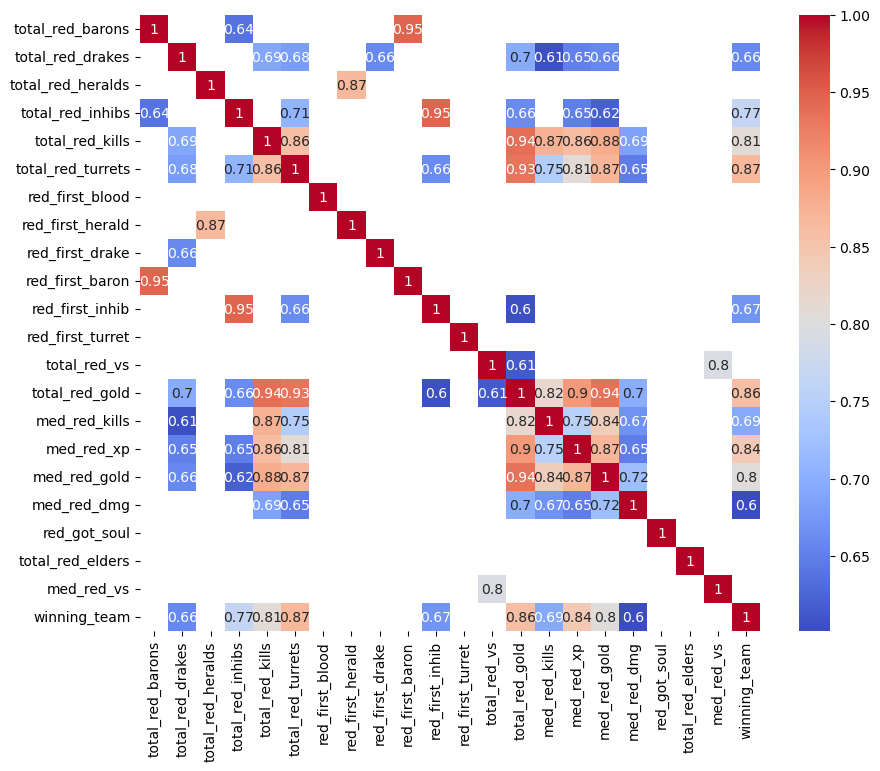

In [12]:
correlation_matrix = dtf_red.corr()

correlation_matrix[np.abs(correlation_matrix) < 0.6] = np.nan

plt.figure(figsize=(10, 8))  # You can adjust the dimensions as needed

# Use Seaborn to create a heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# Display the heatmap
plt.show()

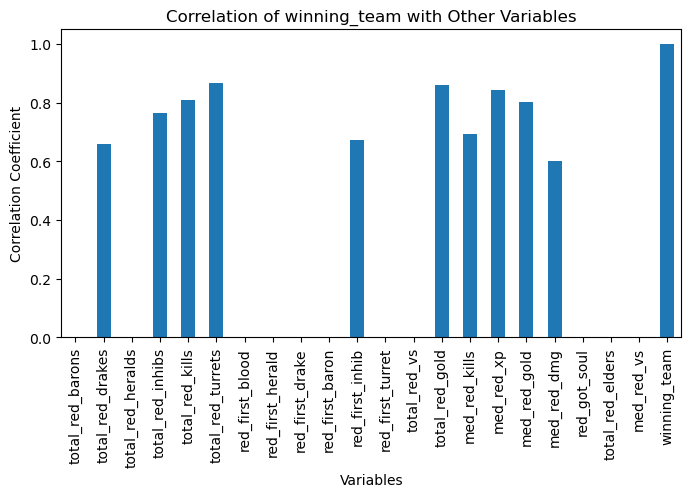

In [13]:
variable1_correlations = correlation_matrix.loc['winning_team']

plt.figure(figsize=(8, 4))
variable1_correlations.plot(kind='bar')
plt.title('Correlation of winning_team with Other Variables')
plt.xlabel('Variables')
plt.ylabel('Correlation Coefficient')
plt.show()

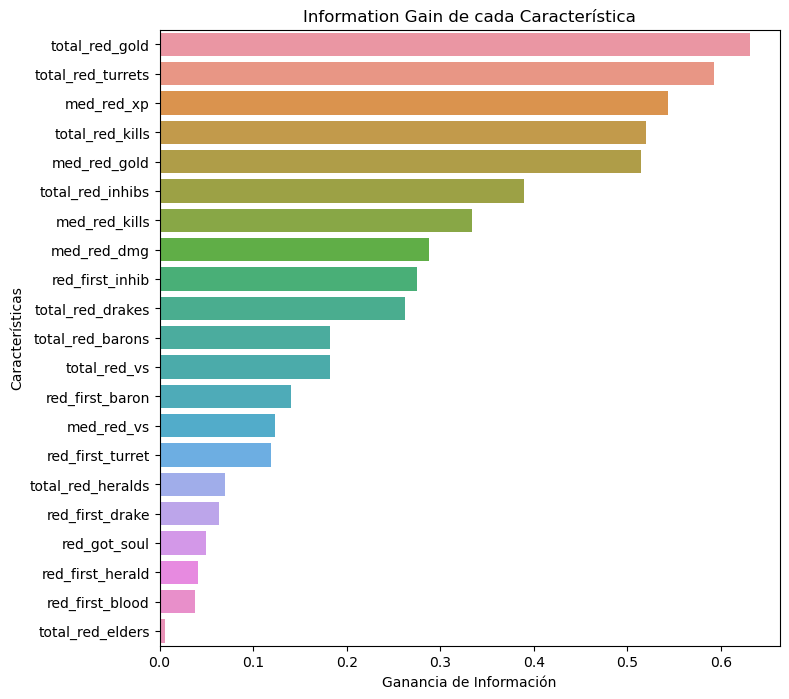

In [14]:
def calculate_information_gain(X, y):
    mi = mutual_info_classif(X, y)
    mi = pd.Series(mi, index=X.columns)
    mi = mi.sort_values(ascending=False)
    return mi

X = dtf_red.drop('winning_team', axis=1)
y = dtf_red['winning_team']
mi_scores = calculate_information_gain(X, y)

# Visualizar
plt.figure(figsize=(8, 8))
sns.barplot(x=mi_scores, y=mi_scores.index)
plt.title('Information Gain de cada Característica')
plt.xlabel('Ganancia de Información')
plt.ylabel('Características')
plt.show()

Las variables con las que me he quedado son:
* total_red_inhibs: Porcentage total de inhibidores que ha destruido el equipo en la partida. ej: si el equipo rojo ha destruido 3 y el azul 1, esta variable tendrá un valor de 0.75.
* total_red_kills: Porcentage total de asesinatos que ha conseguido el equipo en la partida.
* total_red_turrets: Porcentage total de torres que ha destruido el equipo en la partida.
* total_red_gold: Porcentage total de oro que ha generado el equipo en la partida.
* winning_team: 1 si el equipo ha ganado la partida, 0 si la ha perdido.

Una vez decididas las variables con las que voy a trabajar, repetire parte del analisi exploratorio para refrescar un poco la memoria.

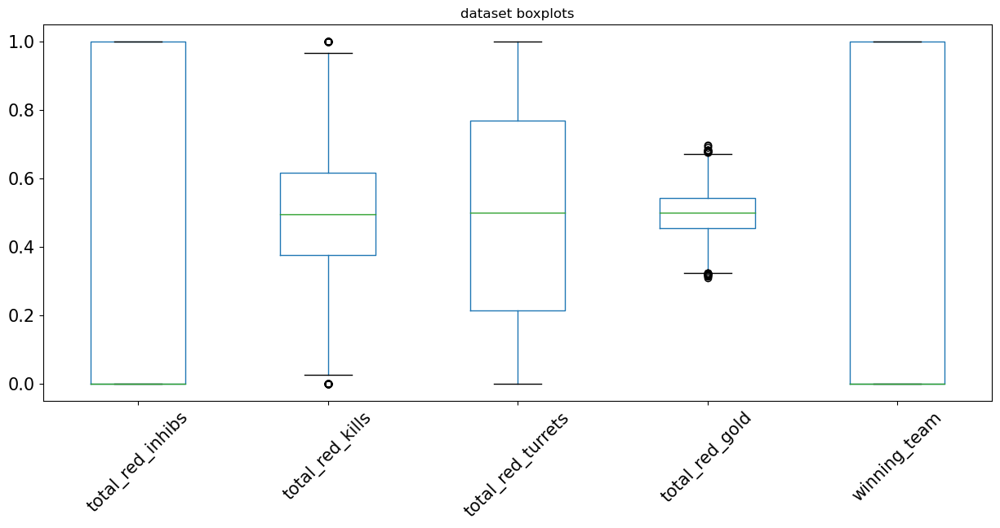

In [15]:
data = dtf_red[['total_red_inhibs','total_red_kills', 'total_red_turrets', 'total_red_gold', 'winning_team']]
data

plt.figure(figsize = (15, 6))
plt.title("dataset boxplots")
data.boxplot(grid=False, rot=45, fontsize=15)
plt.show()

Los boxplots, por la naturaleza de los datos no aportan demasiado información. Todas las variables tienen un rango de valores de 0 a 1, a excepción del oro que tiene un rango menor ya que es imposible generar el 100% del oro, ya por el mero hecho de que recibes oro a medida que pasa el tiempo.

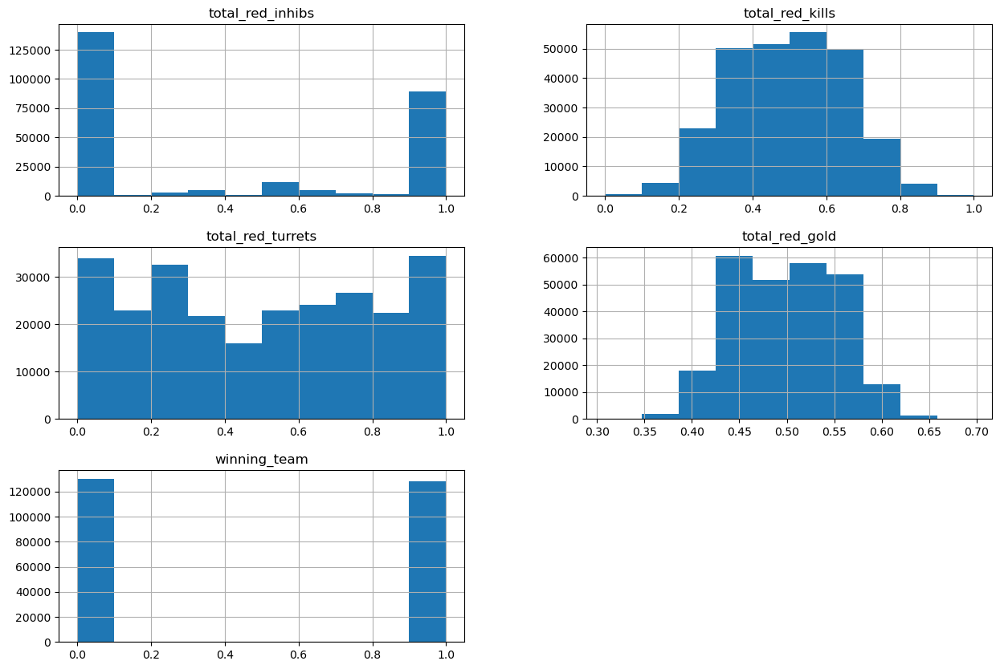

In [16]:
fig = plt.figure(figsize = (15,10))
ax = fig.gca()
data.hist(ax = ax)
plt.show()

A través de estos histogramas veo un par de variables que si ya me gustaban antes, ahora me encantan. Hablo principalmente de las variables total_red_kils y total_red_gold, la cuales siguen una distribucion muy parecida a una normal.

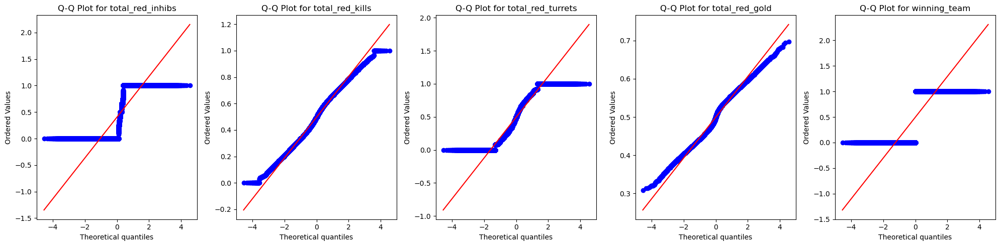

In [17]:
fig, axes = plt.subplots(1, len(data.columns), figsize=(20, 5))  # Ajusta el tamaño según tus necesidades

# Generar un gráfico Q-Q para cada columna
for ax, col in zip(axes, data.columns):
    stats.probplot(data[col], dist="norm", plot=ax)
    ax.set_title(f'Q-Q Plot for {col}')

plt.tight_layout()
plt.show()

Aunque los resultados del test de shapiro y el test ANOVA, por la natrualeza de los datos, no fueron aplicables, gracias a los gráficos qqplot podemos apreciar como realmente las variables mencionadas anteriormente siguen una distribución normal, o almenos algo muy parecido a ello.

<Figure size 500x2000 with 0 Axes>

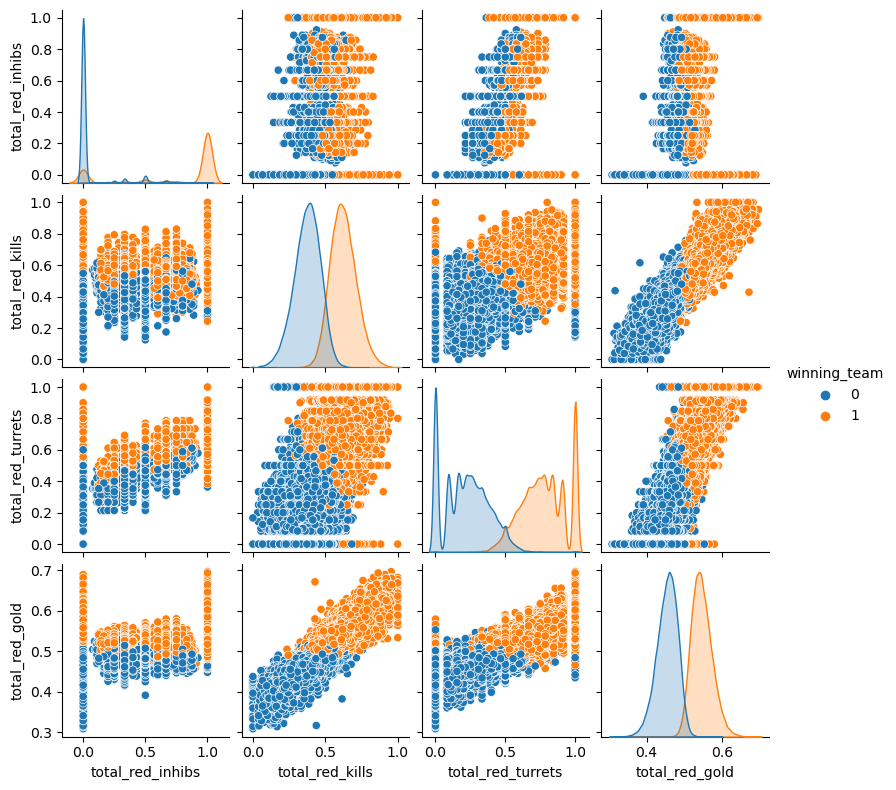

In [18]:
plt.figure(figsize = (5, 20))
sns.pairplot(data,  hue='winning_team', height=2, palette = "tab10")
plt.show()

Como vemos tanto las victorias como las derrotas siguen las mismas distribuciones con distintas medias, a excepción de las torres, que siguen una distribución inversa. Lo más interesante de estas gráficas es que en todas ellas podemos identificar y separar fácilmente las 2 categorias, victoria y derrota.

### Conclusiones variables


En cuanto a las conclusiones de las variables repetiré lo ya mencionado en la entrega de clasificación, que es para la que trataré de optimizar los algoritmos. Para evitar repetitivad me quedaré con los 3 algoritmos usados para la clasificación binaria.

En total, realizaré clasificaciones binarias con los algoritmos de regresión logística, árboles de decision y KNN, y para la clasificación binaria he decidido usar el método de árboles de decision. Lo he decidido así por un par de razones principales, primero de todo los árboles de decision proporcionan un modelo claro y lógico que puede ser fácilmente visualizado y comprendido. Además, el coste de estos es muy menor al del KNN.

En el caso de la clasificacion binaria con la variable winning_team, hemos encontrado que las mejores variables para identificarla son los porcentages de inhibidores, torres, asesinatos y oro. Priorizando, en caso de ser necesario, el uso de la variable de oro generado que hemos visto que es la que marca la mayor diferencia entre los grupos, seguida de el porcentage de asesinatos la cual también sigue una distribución normal y también permite identificar dos grupos con similar distribución pero distinta media.

### Notita friendly para mi corrector/a favorito/a

Esta cosa tan bonita que vendra ahora se paso un gran numero de segundos, minutos y horas compilando, recomiendo que si vas a ejecutarlo reduzcas el tamaño del dataframe.

## Optimización

### Regresión Logística

In [154]:
import warnings
warnings.filterwarnings('ignore')

X = data.drop('winning_team', axis=1)
y = data['winning_team']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

start_time = time.time()

# Initialize and train the logistic regression model
Lr = LogisticRegression(random_state=42)
Lr.fit(X_train, y_train)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en entrenarse.")


# Make predictions on the test set
start_time = time.time()
y_pred = Lr.predict(X_test)
end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en clasificar.")


# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

# Print the results
print(f"Accuracy: {accuracy:.4f}")
print("\nClassification Report:")
print(classification_rep)

El modelo tardó 0.3974595069885254 segundos en entrenarse.
El modelo tardó 0.002999544143676758 segundos en clasificar.
Accuracy: 0.9785

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98     32436
           1       0.98      0.98      0.98     32136

    accuracy                           0.98     64572
   macro avg       0.98      0.98      0.98     64572
weighted avg       0.98      0.98      0.98     64572



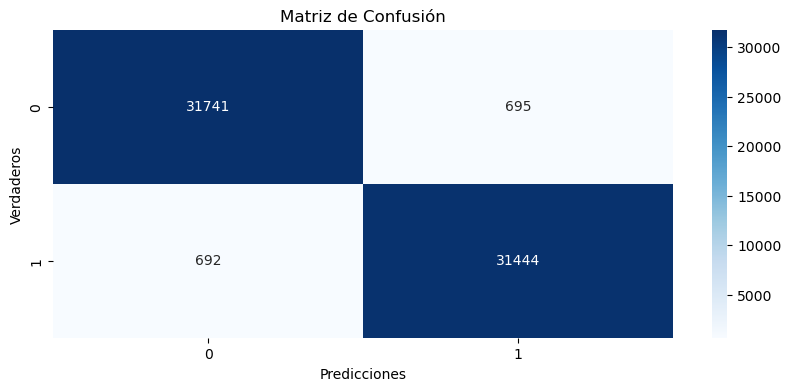

In [106]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Verdaderos')
plt.xlabel('Predicciones')
plt.show()

Observamos como el modelo base de regresion logística tiene un acuracy que a priori no parece malo, sin embargo si recordamos lo obtenido en la entrega de clasificación, es menor a lo que conseguimos. Tambíen apreciamos como el tiempo de creación del modelo es menor a 1 segundo pero esto podria cambiar tocando parametros como el maximo de iteraciones.

#### GridSearch

In [21]:
X = data.drop('winning_team', axis=1)
y = data['winning_team']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

start_time = time.time()

lr_classifier = LogisticRegression()

# Define parameter grid for GridSearch
param_grid = {
    'C': [1, 2, 4],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag'],  
    'max_iter': [100, 250, 450],
    'class_weight': [None, 'balanced']
}

grid_search = GridSearchCV(estimator=lr_classifier, param_grid=param_grid, cv=5, n_jobs=1)
grid_search.fit(X_train, y_train)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en entrenarse.")

best_params = grid_search.best_params_

print("Best Parameters:", best_params)

El modelo tardó 2230.8372251987457 segundos en entrenarse.
Best Parameters: {'C': 2, 'class_weight': 'balanced', 'max_iter': 250, 'penalty': 'l1', 'solver': 'liblinear'}


In [150]:
modelLrG = LogisticRegression(C=2, class_weight='balanced',max_iter=250,penalty='l1' , solver='liblinear')
modelLrG.fit(X_train,y_train)

start_time = time.time()

y_pred = modelLrG.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en clasificar.")

print(f'Precisión del modelo: {accuracy}')

El modelo tardó 0.012959718704223633 segundos en clasificar.
Precisión del modelo: 0.9827324536951001


Con la aplicación de la optimizacion con GridSearch observamos un tiempo de entrenamiento realmente alto de más de 35 minutos para un incremento en la precisión de apenas 0.03, lo cual dependiendo del caso de uso podria no ser aconsejable. Tambíen habrá que esperar al resto de algoritmos para poder evaluar el exito de este método en concreto. También observamos como limita las iteraciones a 250, lo cual es interesante porque determina que iterando más estaría perdiendo precisión, esto también me indica que probablemente no tenga demasiado margen de mejora.

In [118]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(modelLrG, X, y, cv=5)
print(scores)

[0.98428123 0.98269354 0.98414542 0.98025437 0.98052539]


Podemos apreciar a través del cross validation que no hay overfitting a un nivel importante puesto que las scores son relativamente parecidas.

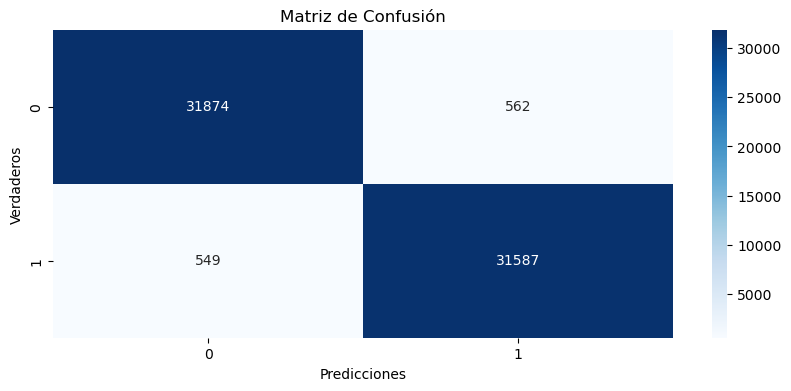

In [103]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Verdaderos')
plt.xlabel('Predicciones')
plt.show()

Observamos una distribucion homogenea entre falsos positivos y negativos.

#### RandomizedSearch

In [24]:
start_time = time.time()

lr_classifier = LogisticRegression()

# Define parameter grid for RandomizedSearch
param_dist = {    
    'C': np.arange(1, 5, 3),
    'penalty': ['l1', 'l2', 'elasticnet'],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag'],  
    'max_iter': np.arange(100, 450, 4),
    'class_weight': [None, 'balanced']
}

# Perform RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=lr_classifier, param_distributions=param_dist, n_iter=1000, cv=3, random_state=33)
random_search.fit(X_train, y_train)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en entrenarse.")

best_params = random_search.best_params_

print("Best Parameters:", best_params)

El modelo tardó 4651.78923535347 segundos en entrenarse.
Best Parameters: {'solver': 'liblinear', 'penalty': 'l1', 'max_iter': 352, 'class_weight': 'balanced', 'C': 4}


In [149]:
modelLrR = LogisticRegression(C=4, class_weight='balanced',max_iter=352,penalty='l1' , solver='liblinear')
modelLrR.fit(X_train,y_train)

start_time = time.time()

y_pred = modelLrR.predict(X_test)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en clasificar.")

accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy}')

El modelo tardó 0.0039637088775634766 segundos en clasificar.
Precisión del modelo: 0.9827324536951001


Con el random search podemos ver como perdemos más del doble de tiempo entrenando el modelo por una mejora negligible por lo que en principio no parece la mejor opción para optimizar la regresión logística, sin embargo una vez el modelo ha sido entrenado, el tiempo que tarda en clasificar es mucho menor.

In [113]:
scores = cross_val_score(modelLrR, X, y, cv=5)
print(scores)

[0.98430059 0.9826161  0.98414542 0.98023501 0.98056411]


Observamos unos resultados del cross validation muy parecidos a los del GridSearch.

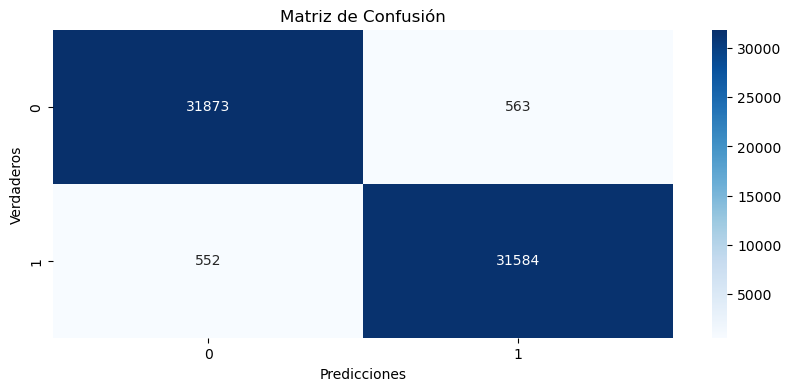

In [101]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Verdaderos')
plt.xlabel('Predicciones')
plt.show()

Igual que antes, distribucion homogenea entre falsos positivos y falsos negativos.

#### BayesianSearch

In [110]:
start_time = time.time()

lr_classifier = LogisticRegression()

# Define parameter search space for Bayesian optimization
param_space = {
    'C': np.arange(1, 5, 3),
    'warm_start': [True, False],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'saga', 'sag'],  
    'max_iter': np.arange(100, 450, 4),
    'class_weight': [None, 'balanced']
}

# Perform Bayesian optimization with Decision Tree
bayes_search = BayesSearchCV(lr_classifier, param_space, n_iter=100, cv=5, n_jobs=1)
bayes_search.fit(X_train, y_train)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en entrenarse.")

# Get the best parameters from Bayesian optimization
best_params = bayes_search.best_params_

print("Best Parameters:", best_params)

El modelo tardó 699.3642137050629 segundos en entrenarse.
Best Parameters: OrderedDict([('C', 4), ('class_weight', None), ('max_iter', 100), ('solver', 'lbfgs'), ('warm_start', False)])


Al realizar este metodo de optimizacion me generaba errores de solvers que no funcionavan con ciertas penaltys por lo que tuve que cambiar los parametros.

In [148]:
modelLrB = LogisticRegression(C=4, class_weight=None,max_iter=444,warm_start=False , solver='sag')
modelLrB.fit(X_train,y_train)

start_time = time.time()

y_pred = modelLrB.predict(X_test)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en clasificar.")

accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy}')

El modelo tardó 0.0019986629486083984 segundos en clasificar.
Precisión del modelo: 0.9816483924921018


Con el cambio de parametros vemos como perdemos precisión por lo que en este caso, aunque el tiempo de entrenamiento y clasificacion sea severamente menor, puede que sea mejor mirar al resto de metodos de optimización debido al menor rendimiento obtenido. Otra cosa que me llama la atención es que nos dice que el mejor número de iteraciones es el menor de los introducidos, por lo que puede que si le diera la opcion de poder escoger un número incluso menor de iteraciones encontrará un mejor modelo, who knows.

In [114]:
scores = cross_val_score(modelLrB, X, y, cv=5)
print(scores)

[0.98401022 0.98110614 0.98290648 0.97911222 0.97984784]


Aqui aunque siguen pareciendose bastante los accuracys, vemos como entre las 2 últimas y la primera existe cierta diferencia que podria indicar un pequeño overfitting.

### Árboles de Decisión

In [147]:
X = data.drop('winning_team', axis=1)
y = data['winning_team']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

start_time = time.time()

Dt = DecisionTreeClassifier()
Dt.fit(X_train,y_train)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en entrenarse.")

start_time = time.time()
y_pred = Dt.predict(X_test)
end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en clasificar.")

accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy}')

El modelo tardó 0.9996986389160156 segundos en entrenarse.
El modelo tardó 0.011002063751220703 segundos en clasificar.
Precisión del modelo: 0.9810908753019885


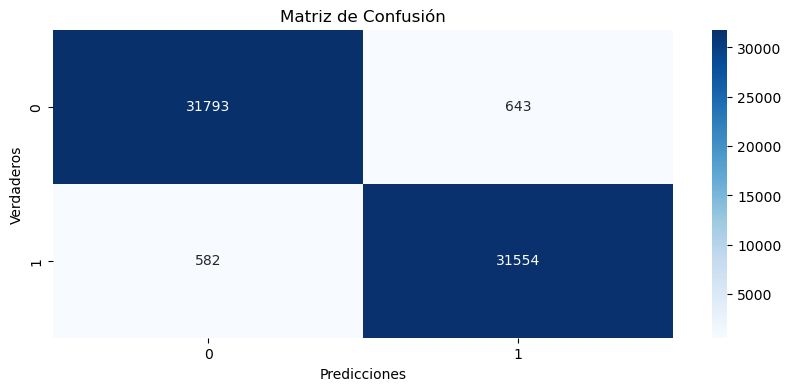

In [99]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Verdaderos')
plt.xlabel('Predicciones')
plt.show()

El modelo base de árboles de decisión resulta incluso más bueno que el modelo de regresión logística con bayes, aunque también observamos un tiempo de entrenamiento base tres veces mayor. Ahora tocará mirar si podemos mejorar este resultado todavía más con los métodos de optimización vistos.

#### GridSearch

In [121]:
start_time = time.time()

dt_classifier = DecisionTreeClassifier(random_state=42)

# Define parameter grid for GridSearch
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'max_leaf_nodes':[50,100,500],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(estimator=dt_classifier, param_grid=param_grid, cv=5, n_jobs=1)
grid_search.fit(X_train, y_train)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en entrenarse.")

best_params = grid_search.best_params_

print("Best Parameters:", best_params)

El modelo tardó 373.543416261673 segundos en entrenarse.
Best Parameters: {'criterion': 'gini', 'max_depth': 15, 'max_leaf_nodes': 100, 'min_samples_leaf': 4, 'min_samples_split': 10}


In [145]:
modelDtG = DecisionTreeClassifier(max_leaf_nodes=100, min_samples_split=10,min_samples_leaf=4,max_depth=15 , criterion='gini')
modelDtG.fit(X_train,y_train)

start_time = time.time()

y_pred = modelDtG.predict(X_test)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en clasificar.")

accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy}')

El modelo tardó 0.0059947967529296875 segundos en clasificar.
Precisión del modelo: 0.9844050052654402


Hasta el momento este ha sido el mejor modelo e optimiziación conseguidos, con la mejor precisión y el menor tiempo de entrenamiento observados hasta ahora. Observamos como nos escoge como mejor profundidad la mayor de las introducidas, lo que nos indica que probablemente introduciendo una mayor profundidad podriamos llegar a conseguir una cierta mejora, lo mismo con el min_samples_split.

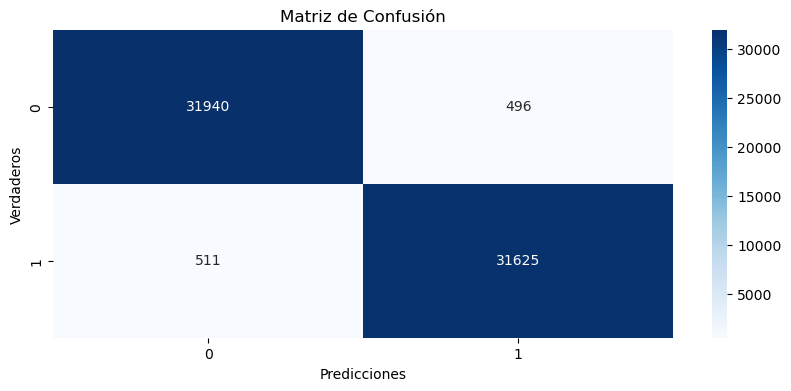

In [95]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Verdaderos')
plt.xlabel('Predicciones')
plt.show()

Apreciamos como efectivamente tenemos menos errores que en los anteriores modelos

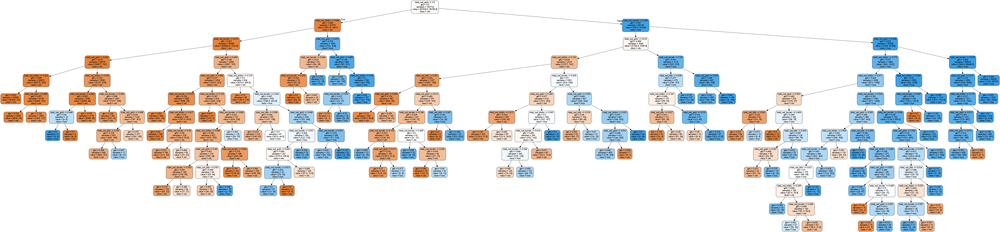

In [96]:
dot_data = StringIO()
export_graphviz(modelDtG,out_file=dot_data,filled=True, rounded=True,  class_names = ['win', 'loss'],
                feature_names = data.columns[:-1] )

graph = pydot.graph_from_dot_data(dot_data.getvalue())

Image(graph[0].create_png())

In [97]:
from sklearn.tree import export_text
from sklearn import tree

# Exportar las reglas del árbol en formato de texto
tree_rules = export_text(modelDtG,max_depth=4, feature_names=list(X.columns))
print(tree_rules)

|--- total_red_gold <= 0.50
|   |--- total_red_inhibs <= 0.85
|   |   |--- total_red_turrets <= 0.51
|   |   |   |--- total_red_gold <= 0.49
|   |   |   |   |--- total_red_inhibs <= 0.24
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- total_red_inhibs >  0.24
|   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |--- total_red_gold >  0.49
|   |   |   |   |--- total_red_inhibs <= 0.24
|   |   |   |   |   |--- truncated branch of depth 3
|   |   |   |   |--- total_red_inhibs >  0.24
|   |   |   |   |   |--- truncated branch of depth 4
|   |   |--- total_red_turrets >  0.51
|   |   |   |--- total_red_gold <= 0.49
|   |   |   |   |--- total_red_gold <= 0.48
|   |   |   |   |   |--- truncated branch of depth 4
|   |   |   |   |--- total_red_gold >  0.48
|   |   |   |   |   |--- truncated branch of depth 6
|   |   |   |--- total_red_gold >  0.49
|   |   |   |   |--- total_red_inhibs <= 0.12
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- total_red_inhibs >  0.12
|  

El árbol presentado por este modelo parece bastante sencillo por sus pocos niveles y hojas pero aún asi ofrece una muy buena clasificiación. También observamos lo que ya sabíamos de entregas anteriores, que el oro es lo más importante, seguido de torres y sorprendentemente inhibidores antes que kills.

#### RandomizedSearch

In [156]:
start_time = time.time()

dt_classifier = DecisionTreeClassifier(random_state=42)

# Define parameter grid for RandomizedSearch
param_dist = {
    'criterion': ['gini', 'entropy'],
    'max_depth': np.arange(3, 20),
    'min_samples_split': np.arange(2, 20, 20),
    'max_leaf_nodes':np.arange(60, 600, 10),
    'min_samples_leaf': np.arange(2, 10)
}

# Perform RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=dt_classifier, param_distributions=param_dist, n_iter=1000, cv=3, random_state=33)
random_search.fit(X_train, y_train)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en entrenarse.")

best_params = random_search.best_params_

print("Best Parameters:", best_params)

El modelo tardó 1235.1700985431671 segundos en entrenarse.
Best Parameters: {'min_samples_split': 2, 'min_samples_leaf': 4, 'max_leaf_nodes': 140, 'max_depth': 18, 'criterion': 'gini'}


In [143]:
modelDtR = DecisionTreeClassifier(max_depth=18, criterion='gini',max_leaf_nodes=140, min_samples_leaf=4 , min_samples_split=2)
modelDtR.fit(X_train,y_train)

start_time = time.time()

y_pred = modelDtR.predict(X_test)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en clasificar.")

accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy}')

El modelo tardó 0.0049974918365478516 segundos en clasificar.
Precisión del modelo: 0.9845908443288113


Tal y como sospechaba, introduciendo un mayor número de posibles profundidades, he conseguido un mínimo de mejora, aunque de la misma manera que en la regresión logística, el tiempo de optimización es más de 3 veces mayor con el RandomisedSearch que con el GridSearch. También me sorprende el valor óptimo de min_samples_split, ya que antes habia visto que puede que no le estuviera dando suficientes posibilidades, sin embargo ahora ha encontrado el valor óptimo en el mínimo.

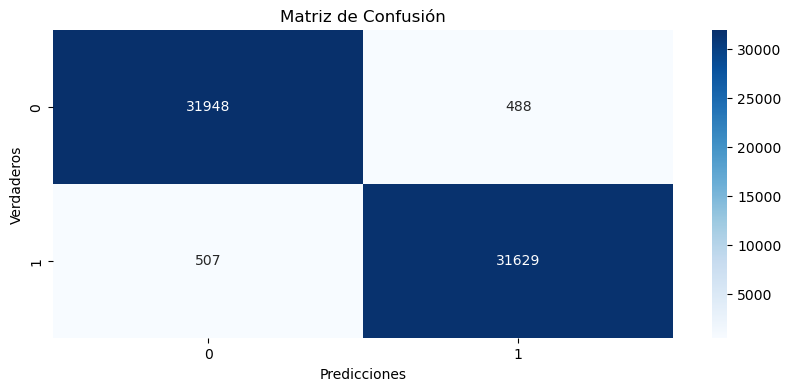

In [91]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Verdaderos')
plt.xlabel('Predicciones')
plt.show()

Apreciamos el menor número de erroes hasta ahora y una distribución de los tipos de estos bastante homogénea.

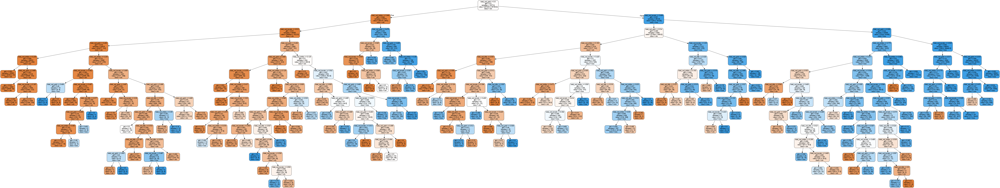

In [92]:
dot_data = StringIO()
export_graphviz(modelDtR,out_file=dot_data,filled=True, rounded=True,  class_names = ['win', 'loss'],
                feature_names = data.columns[:-1] )

graph = pydot.graph_from_dot_data(dot_data.getvalue())

Image(graph[0].create_png())

In [93]:
tree_rules = export_text(modelDtR,max_depth=4, feature_names=list(X.columns))
print(tree_rules)

|--- total_red_gold <= 0.50
|   |--- total_red_inhibs <= 0.85
|   |   |--- total_red_turrets <= 0.51
|   |   |   |--- total_red_gold <= 0.49
|   |   |   |   |--- total_red_inhibs <= 0.24
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- total_red_inhibs >  0.24
|   |   |   |   |   |--- truncated branch of depth 3
|   |   |   |--- total_red_gold >  0.49
|   |   |   |   |--- total_red_inhibs <= 0.24
|   |   |   |   |   |--- truncated branch of depth 6
|   |   |   |   |--- total_red_inhibs >  0.24
|   |   |   |   |   |--- truncated branch of depth 8
|   |   |--- total_red_turrets >  0.51
|   |   |   |--- total_red_gold <= 0.49
|   |   |   |   |--- total_red_gold <= 0.48
|   |   |   |   |   |--- truncated branch of depth 6
|   |   |   |   |--- total_red_gold >  0.48
|   |   |   |   |   |--- truncated branch of depth 9
|   |   |   |--- total_red_gold >  0.49
|   |   |   |   |--- total_red_inhibs <= 0.12
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- total_red_inhibs >  0.12
|  

Observamos como este árbol tiene una mayor complejidad que el anterior, sin embargo los primeros niveles són practicamente clavados.

#### BayesSearch

In [155]:
start_time = time.time()

dt_classifier = DecisionTreeClassifier(random_state=42)

# Define parameter search space for Bayesian optimization
param_space = {
    'criterion': ['gini', 'entropy'],
    'max_depth': np.arange(3, 20),
    'min_samples_split': np.arange(2, 20, 20),
    'max_leaf_nodes':np.arange(60, 600, 10),
    'min_samples_leaf': np.arange(2, 10)
}

# Perform Bayesian optimization with Decision Tree
bayes_search = BayesSearchCV(dt_classifier, param_space, n_iter=100, cv=5, n_jobs=1)
bayes_search.fit(X_train, y_train)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en entrenarse.")

# Get the best parameters from Bayesian optimization
best_params = bayes_search.best_params_

print("Best Parameters:", best_params)

El modelo tardó 693.4694991111755 segundos en entrenarse.
Best Parameters: OrderedDict([('criterion', 'gini'), ('max_depth', 17), ('max_leaf_nodes', 220), ('min_samples_leaf', 4), ('min_samples_split', 2)])


In [142]:
modelDtB = DecisionTreeClassifier(max_depth=15, criterion='gini',max_leaf_nodes=240, min_samples_leaf=4 , min_samples_split=2)
modelDtB.fit(X_train,y_train)

start_time = time.time()

y_pred = modelDtB.predict(X_test)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en clasificar.")

accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy}')

El modelo tardó 0.005584001541137695 segundos en clasificar.
Precisión del modelo: 0.9847766833921824


Como nos gusta el colega Bayes, en cuánto a árboles nos hemos encontrado con el mejor modelo gracias a el. Con una pequeña mejora respecto al RandomisedSearch y en dos tercios de su tiempo de entrenamiento, ha encontrado una combinacion que parece combinar las dos soluciones encontradas por los previos modelos, además de generar un árbol que a priori, parece no demasiado caótico.

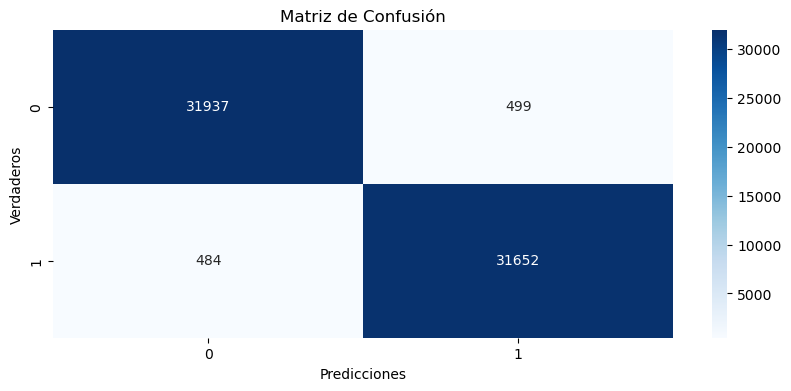

In [139]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Verdaderos')
plt.xlabel('Predicciones')
plt.show()

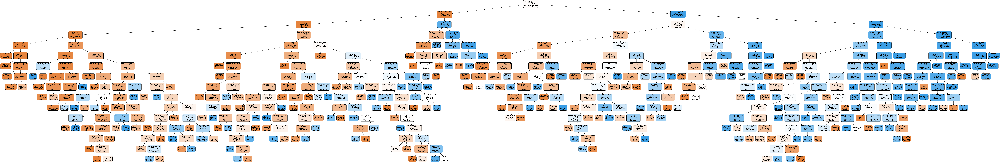

In [133]:
dot_data = StringIO()
export_graphviz(modelDtB,out_file=dot_data,filled=True, rounded=True,  class_names = ['win', 'loss'],
                feature_names = data.columns[:-1] )

graph = pydot.graph_from_dot_data(dot_data.getvalue())

Image(graph[0].create_png())

In [134]:
tree_rules = export_text(modelDtB,max_depth=4, feature_names=list(X.columns))
print(tree_rules)

|--- total_red_gold <= 0.50
|   |--- total_red_inhibs <= 0.85
|   |   |--- total_red_turrets <= 0.51
|   |   |   |--- total_red_gold <= 0.49
|   |   |   |   |--- total_red_inhibs <= 0.24
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- total_red_inhibs >  0.24
|   |   |   |   |   |--- truncated branch of depth 4
|   |   |   |--- total_red_gold >  0.49
|   |   |   |   |--- total_red_inhibs <= 0.24
|   |   |   |   |   |--- truncated branch of depth 6
|   |   |   |   |--- total_red_inhibs >  0.24
|   |   |   |   |   |--- truncated branch of depth 11
|   |   |--- total_red_turrets >  0.51
|   |   |   |--- total_red_gold <= 0.49
|   |   |   |   |--- total_red_gold <= 0.48
|   |   |   |   |   |--- truncated branch of depth 8
|   |   |   |   |--- total_red_gold >  0.48
|   |   |   |   |   |--- truncated branch of depth 11
|   |   |   |--- total_red_gold >  0.49
|   |   |   |   |--- total_red_inhibs <= 0.12
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- total_red_inhibs >  0.12
|

Vale retiro lo dicho, un poquito caotico si que es, pero eso no cambia nada, seguimos teniendo un tiempo de entrenamiento razonable a cambio del mejor modelo, y al igual que antes, comparte las decisiones de los primeros niveles con los otros modelos.

### KNN

In [141]:
start_time = time.time()

knn = KNeighborsClassifier()
knn.fit(X_train,y_train)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en entrenarse.")

# Predecir con el modelo
start_time = time.time()
y_pred = knn.predict(X_test)
end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en predecir.")

accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy}')

print("\nInforme de Clasificación:")
print(classification_report(y_test, y_pred))

El modelo tardó 0.2955472469329834 segundos en entrenarse.
El modelo tardó 3.8759522438049316 segundos en predecir.
Precisión del modelo: 0.983382890416899

Informe de Clasificación:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98     32436
           1       0.98      0.98      0.98     32136

    accuracy                           0.98     64572
   macro avg       0.98      0.98      0.98     64572
weighted avg       0.98      0.98      0.98     64572



Diablo, KNN realmente tarda en darnos una clasificacion comparado con el resto de algoritmos, aunque la precisión del modelo base lo vale, la mejor de entre los modelos base.

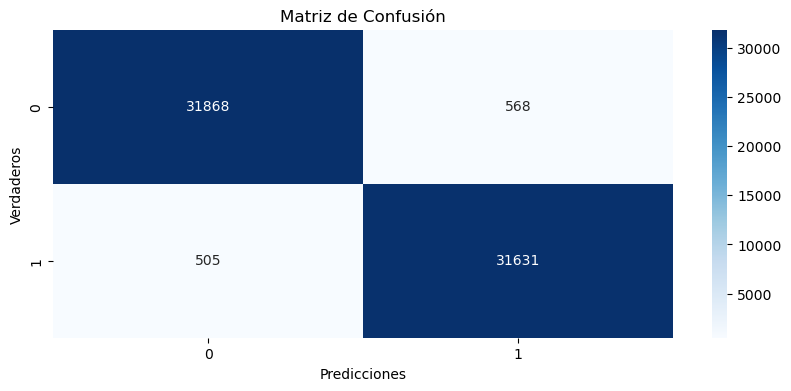

In [55]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Verdaderos')
plt.xlabel('Predicciones')
plt.show()

#### GridSearch

In [56]:
X = data.drop('winning_team', axis=1)
y = data['winning_team']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

start_time = time.time()

knn_classifier = KNeighborsClassifier()

# Define parameter grid for GridSearch
param_grid = {
    'n_neighbors': [2, 8, 15],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski'],
    'leaf_size': [5 ,15, 25],
    'p': [0, 1, 2]
}

grid_search = GridSearchCV(estimator=knn_classifier, param_grid=param_grid, cv=5, n_jobs=1)
grid_search.fit(X_train, y_train)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en entrenarse.")


best_params = grid_search.best_params_

print("Best Parameters:", best_params)

El modelo tardó 5703.7831444740295 segundos en entrenarse.
Best Parameters: {'leaf_size': 5, 'metric': 'euclidean', 'n_neighbors': 15, 'p': 1, 'weights': 'distance'}


In [86]:
modelKnnG = KNeighborsClassifier(leaf_size=5, metric='euclidean',n_neighbors=15,p=1 , weights='distance')
modelKnnG.fit(X_train,y_train)

start_time = time.time()

y_pred = modelKnnG.predict(X_test)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en predecir.")

accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy}')

Precisión del modelo: 0.9845443845629684


Observamos un resultado que a pesar de ser mejor que su modelo base, no llega a ser tan bueno como el conseguido a través de la optimización bayesiana con arboles de decisión, y eso no tendría porque ser un factor para descartar el modelo, sin embargo al ver como el tiempo en encontrar la mejor parametrización supera la hora y media, podriamos decir que no es muy deseable encontrar una parametrización óptima de KNN de esta manera.

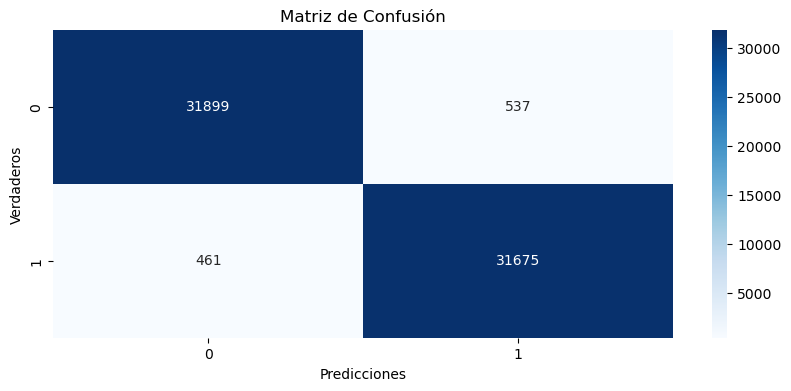

In [87]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Verdaderos')
plt.xlabel('Predicciones')
plt.show()

Ya para acabar de rematar al algoritmo aqui apreciamos lo que podria ser un pequeño de sesgo entre falsos positivos y negativos.

#### RandomizedSearch

In [59]:
start_time = time.time()

knn_classifier = KNeighborsClassifier()

# Define parameter grid for RandomizedSearch
param_dist = {
    'n_neighbors': np.arange(1, 31, 10),
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski'],
    'leaf_size': np.arange(20, 50, 10),
    'p': [1, 2]
}

# Perform RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=knn_classifier, param_distributions=param_dist, n_iter=1000, cv=3, random_state=33)
random_search.fit(X_train, y_train)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en entrenarse.")

best_params = random_search.best_params_

print("Best Parameters:", best_params)

El modelo tardó 683.9160521030426 segundos en entrenarse.
Best Parameters: {'weights': 'distance', 'p': 1, 'n_neighbors': 21, 'metric': 'manhattan', 'leaf_size': 20}


In [157]:
modelKnnR = KNeighborsClassifier(leaf_size=20, metric='manhattan',n_neighbors=21, p=1 , weights='distance')
modelKnnR.fit(X_train,y_train)

start_time = time.time()

y_pred = modelKnnR.predict(X_test)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en predecir.")

accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy}')

El modelo tardó 1.6091694831848145 segundos en predecir.
Precisión del modelo: 0.9849470358669392


Observamos una gran diferencia respecto a lo observado con el optimizador de GridSearch, primero hemos obtenido un tiempo de entrenamiento relativamente bajo para todo lo que hemos estado viendo hasta ahora y además, es la mejor precisión que hemos encontrado hasta ahora, posiblemente debido a que el rango posible de numero de neighors es más alto que el anterior y ha podido probar valores que el GridSearch no. Si bien es cierto que el tiempo en predecir de KNN sigue siendo considerablemente superior al del resto de algoritmos, este ha sido un gran resultado.

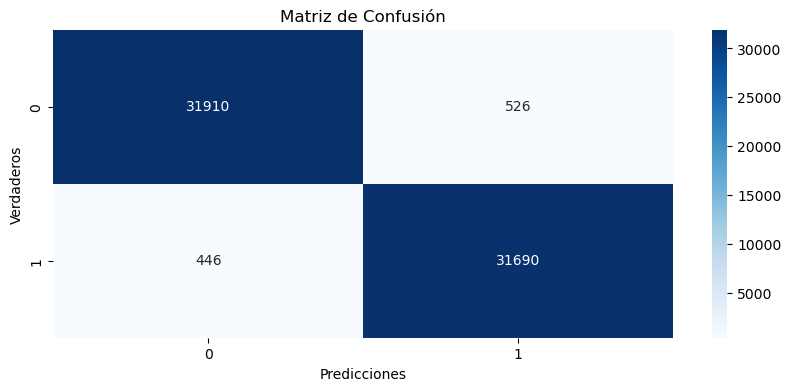

In [158]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Verdaderos')
plt.xlabel('Predicciones')
plt.show()

Algo que podria preocupar de este modelo es que podria haber un sesgo entre los falsos positivos y negativos ya que no es tan homogéneo como en otros casos.

#### BayesianSearch

In [77]:
start_time = time.time()

knn_classifier = KNeighborsClassifier()

# Define parameter search space for Bayesian optimization
param_space = {
    'n_neighbors': np.arange(1, 31, 10),
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski'],
    'leaf_size': np.arange(20, 50, 10),
    'p': [1, 2]
}

# Perform Bayesian optimization with Decision Tree
bayes_search = BayesSearchCV(knn_classifier, param_space, n_iter=100, cv=5, n_jobs=1)
bayes_search.fit(X_train, y_train)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en entrenarse.")

# Get the best parameters from Bayesian optimization
best_params = bayes_search.best_params_

print("Best Parameters:", best_params)

El modelo tardó 1032.6801438331604 segundos en entrenarse.
Best Parameters: OrderedDict([('leaf_size', 40), ('metric', 'euclidean'), ('n_neighbors', 21), ('p', 1), ('weights', 'distance')])


In [159]:
modelKnnB = KNeighborsClassifier(leaf_size=40, metric='euclidean',n_neighbors=21, p=1 , weights='distance')
modelKnnB.fit(X_train,y_train)

start_time = time.time()

y_pred = modelKnnB.predict(X_test)

end_time = time.time()
duration = end_time - start_time
print(f"El modelo tardó {duration} segundos en predecir.")

accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy}')

El modelo tardó 2.246103286743164 segundos en predecir.
Precisión del modelo: 0.9847457102149538


Observamos un tiempo de entrenamiento mayor al de RandomSearch por un menor rendimiento y pese a que sigue siendo una mucho mejor opción que el GridSearch en este caso, no puede compararse al RandomSearch. Apreciamos también que ha elegido el mismo número de neighbors que en el último así que seguramente podríamos ver una mejora mínima en el GridSearch si le permitieramos probar por ese valor.

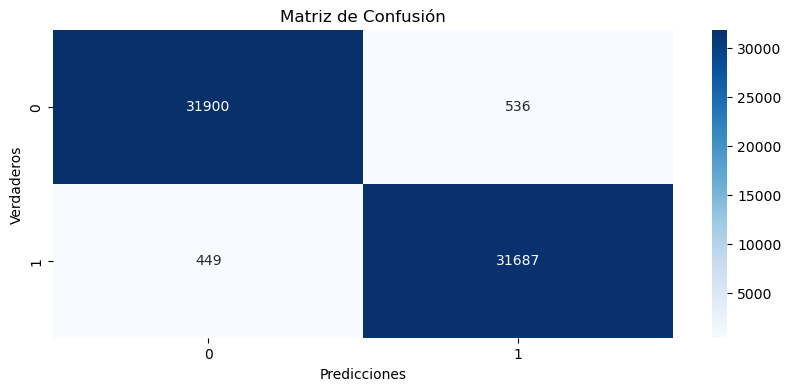

In [160]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Verdaderos')
plt.xlabel('Predicciones')
plt.show()

En general, con KNN parecemos tener algun tipo de pequeño sesgo en los falsos verdaderos.

## Conclusiones

Tras la realización de este proyecto hemos visto primero, un análisis de optimizaciones de los métodos  vistos en la entrega de clasficicacion. Con un análisis de datos resumido de las entregas previas juntando las cosas que me han parecido más importantes y comprimiendolas. Gracias a este análisis pude podido escoger de la mejor forma las variables para clasificar según mi variable objetivo tanto en la clasificación binaria.

En cuánto a los algoritmos de optimización, voy a hacer un breve resumen de lo que hemos aprendido para cada una de las clasificaciones:

* Regresión Logística: Aquí hemos visto el análisis con las precisiones más bajas y mayor tiempo medio de entrenamiento por lo que a priori no me quedaria con esta opcion. Aqui el mejor resultado lo hemos obtenido con RandomSearch, aunque ha sido a costa de un tiempo de entrenamiento enorme, tambien hemos visto que con el modelo presentado con Bayes podria llegar a haber algo de overfitting aunque nada alarmante.

* Árboles de Decisión: En los árboles de decision es donde hemos encontrado los menores tiempos de entrenamiento además de por la naturaleza del modelo, ofrece los resultados más comprensibles al poder ver fácilmente que decisiones toma el modelo para clasificar. El mejor modelo lo hemos obtenido gracias a Bayes y se ha quedado realmente cerca del mejor modelo global con uno de los mejores tiempos de compilacion.

* KNN: El KNN ha levantado amor y odio por partes iguales, por un lado hemos visto la mejor de las precisiones al optimizar el algoritmo mediante el RandomSearch, pero al mismo tiempo hemos visto el mayor tiempo de compilacion superando la hora y media con el GridSearch y tambien hemos observado un posible sesgo en cuanto a los falsos verdaderos, además de ser el único algoritmo que tardaba un tiempo considerablemente alto en ofrecer una clasificacion una vez entrenado.

En general los modelos han ofrecido muy buenos resultados pero como conclusiones de lo observado podriamos comentar que el algoritmo que ha parecido ser más estable y adaptable ofreciendo los mejores resultados a lo largo de los modelos ha sido el RandomSearch ofreciendo buenas predicciones en todos los casos. En cuanto a los tiempos de compilacion, ha dependido mucho de las posibles parametrizaciones observables, ya que en el caso de GridSearch hemos visto un tiempo exagerado con KNN pero un timepo realmente pequeño con los árboles de decisión. Lo mismo ha pasado con RandomSearch ofreciendo tiempos razonables con KNN y los árboles pero una eternidad con la regresión logística.

## Final final

A ver la verdad es que no veo demasiado a criticar de la asignatura sinceramente, me ha parecido bastante bien organizada y con sentido, tocando un poco de todo y adquiriendo los conocimientos esperados. Puede que en cuanto a la carga de trabajo podriamos distribuirla más homgeneamente a través del semestre, ya que estas ultimas 4 semanas han sido bastante locas (pero eso es tambien mi opinion sesgada porque justo he empezado a trabajar).

Otra cosa que me viene a la mente, sería comprimir un poco lo más basico de las primeras lecciones en menos clases, para poder tener tiempo a hacer cosas más guays en las últimas. Esto claro, se debe a que vengo de un background más tecnico y justo acababa de terminar la carrera así que lo tenia todo bastante fresco, así que al principio ibamos chilling.

El tono de las clases me ha parecido muy acertado, mezclando seriedad y conocimiento con mucho humor y cosas frikis. Y en general lo dicho, muy buena experiencia.

... Un regalito para que te rias de mi ... https://www.op.gg/summoners/euw/MEGAKI295-EUW